## ***Name: Shourya Gupta<br>Roll No.: N031<br>MBA Tech CE Sem V***

### **Common import statements**

In [91]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
from skimage import io
from skimage.color import rgb2gray
import cv2 as cv
import scipy.ndimage as nd
from skimage import data
from scipy.linalg import hadamard
import random
from scipy.fftpack import dct
from scipy.fftpack import idct
import glob

# **Experiment 01 Image Enhancement**

## **(a) Digital Negative**

(512, 512) uint8 <class 'numpy.ndarray'>


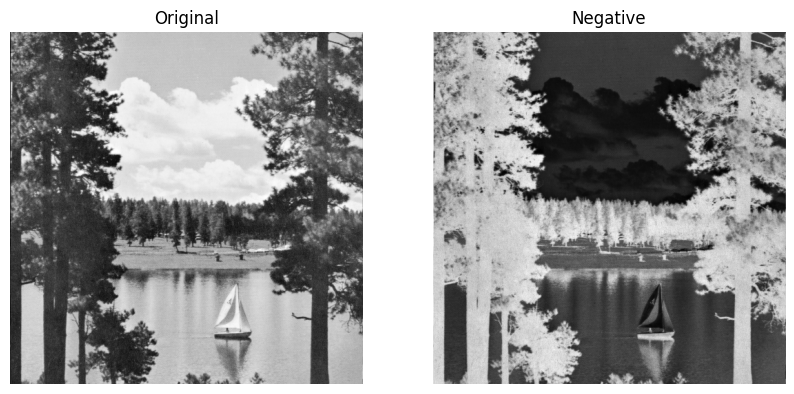

In [92]:
im = mpimg.imread('lake.tif')
print(im.shape, im.dtype, type(im))

im_neg = 255 - im

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(im, cmap = 'gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(im_neg, cmap = 'gray')
plt.title('Negative')
plt.axis('off')

plt.show()

## **(b) Thresholding**

(512, 512) uint8 <class 'numpy.ndarray'>
Enter Threshold: 127


(-0.5, 511.5, 511.5, -0.5)

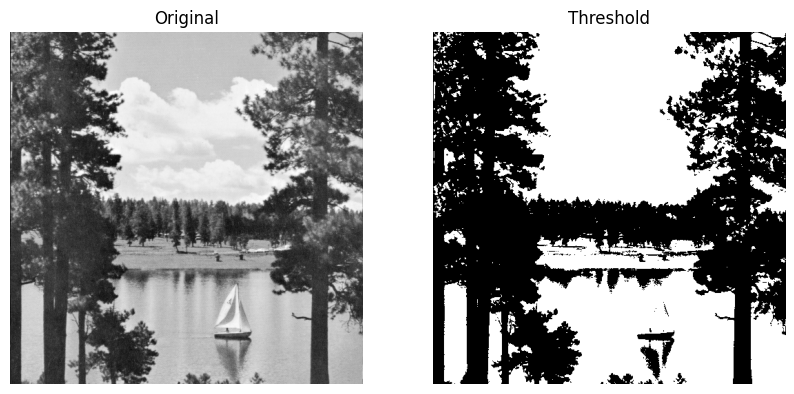

In [93]:
im = mpimg.imread('lake.tif')
print(im.shape, im.dtype, type(im))

threshold = int(input("Enter Threshold: "))

imgt = im.copy()
for i in range(imgt.shape[0]):
  for j in range(imgt.shape[1]):
    if imgt[i, j] > threshold:
      imgt[i, j] = 255
    else:
      imgt[i, j] = 0

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.imshow(im, cmap = 'gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Threshold')
plt.imshow(imgt, cmap = 'gray')
plt.axis('off')

## **(c) Contrast Stretching**

(512, 512) uint8 <class 'numpy.ndarray'>
Point 1: 100 50
Point 2: 200 220


(-0.5, 511.5, 511.5, -0.5)

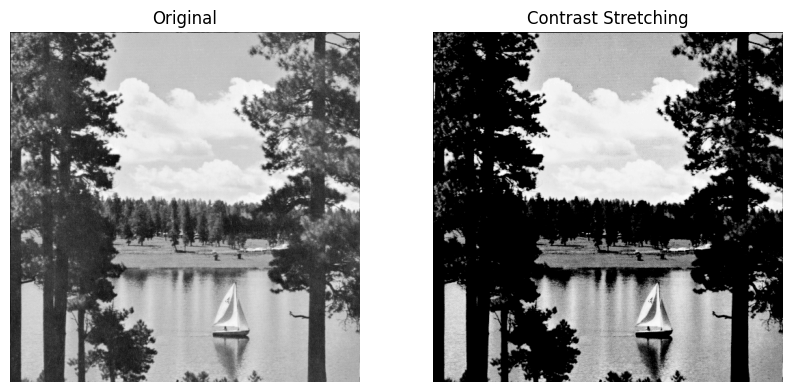

In [94]:
im = mpimg.imread('lake.tif')
print(im.shape, im.dtype, type(im))

imgcs = im.copy()

def slope(x1, y1, x2, y2):
  return (y2 - y1)/(x2 - x1)

r1, s1 = tuple(int(i) for i in (input('Point 1: ')).split())
r2, s2 = tuple(int(i) for i in (input('Point 2: ')).split())

alpha = slope(0, 0, r1, s1)
beta = slope(r1, s1, r2, s2)
gamma = slope(r2, s2, 255, 255)

(alpha, beta, gamma)

for i in range(imgcs.shape[0]):
  for j in range(imgcs.shape[1]):
    r = imgcs[i, j]
    if r <= r1:
      imgcs[i, j] = alpha*r1
    elif r1 < r and r <= r2:
      imgcs[i, j] = beta*(r - r1) + s1
    else:
      imgcs[i, j] = gamma*(r - r2) + s2

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(im, cmap = 'gray')
plt.title('Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Contrast Stretching')
plt.imshow(imgcs, cmap = 'gray')
plt.axis('off')

## **(d) Intensity Level Slicing**

(512, 512) uint8 <class 'numpy.ndarray'>
Enter Threshold 1: 185
Enter Threshold 2: 205


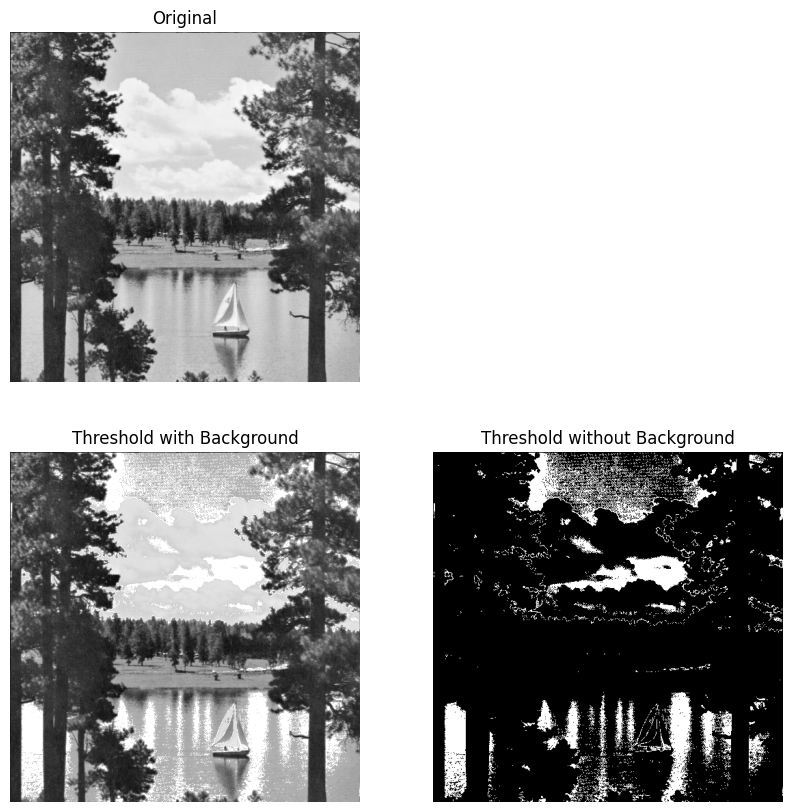

In [95]:
im = mpimg.imread('lake.tif')
print(im.shape, im.dtype, type(im))

t1 = int(input("Enter Threshold 1: "))
t2 = int(input("Enter Threshold 2: "))

imgtb = im.copy()
for i in range(imgtb.shape[0]):
  for j in range(imgtb.shape[1]):
    if t1 <= imgtb[i, j] and imgtb[i, j] <= t2:
      imgtb[i, j] = 255

imgtwb = im.copy()
for i in range(imgtwb.shape[0]):
  for j in range(imgtwb.shape[1]):
    if t1 <= imgtwb[i, j] and imgtwb[i, j] <= t2:
      imgtwb[i, j] = 255
    else:
      imgtwb[i, j] = 0

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(im, cmap = 'gray')
plt.title('Original')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Threshold with Background')
plt.imshow(imgtb, cmap = 'gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Threshold without Background')
plt.imshow(imgtwb, cmap = 'gray')
plt.axis('off')
plt.show()

# **Experiment 02 Image Manipulation**

## **(a) Changing the Resolution**

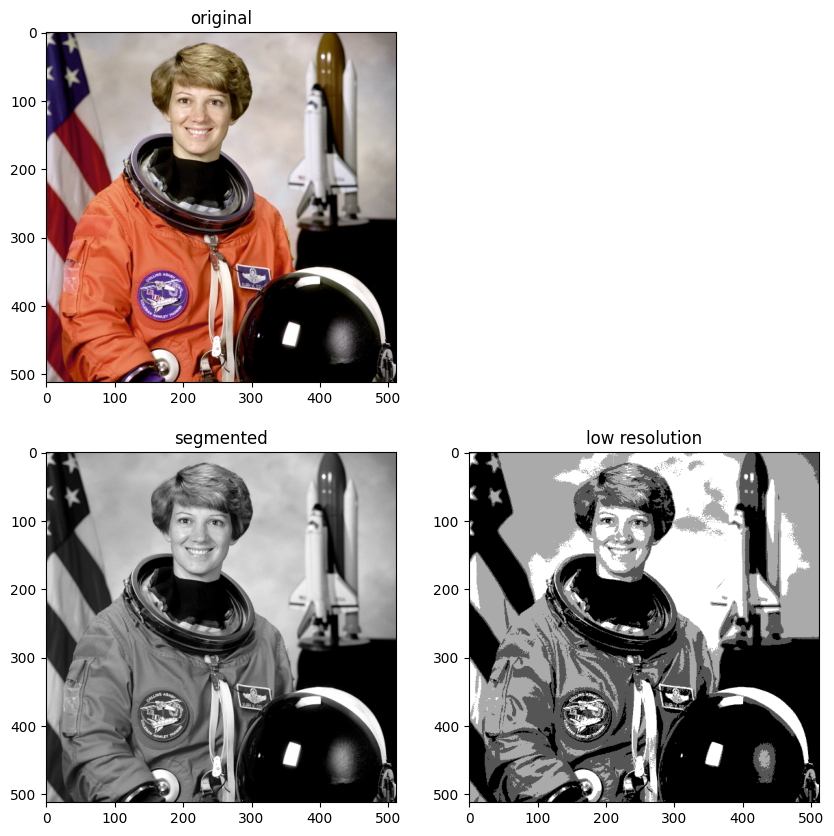

In [96]:
image = data.astronaut()
image_gray = 255*(rgb2gray(image))

image_reso = image_gray.copy()

b = 2
num_levels = 2**b
step_level = int(256/num_levels)

sh = image_reso.shape
pixel_value = 0

for row in range(0, sh[0]):
  for col in range(0, sh[1]):
      temp = image_reso[row][col]
      for i in range(0, num_levels):
        if temp >= i*step_level and temp < (i+1)*step_level:
          image_reso[row][col] = i*step_level
          break

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.title('original')
plt.imshow(image, cmap = 'gray')


plt.subplot(2, 2, 3)
plt.title('segmented')
plt.imshow(image_gray, cmap = 'gray')

plt.subplot(2, 2, 4)
plt.title('low resolution')
plt.imshow(image_reso, cmap = 'gray')

plt.show()

## **(b) Downsampling**

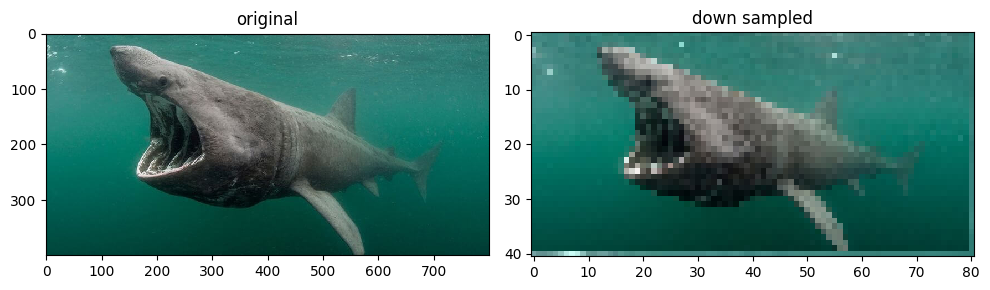

In [97]:
image = io.imread('shark-1.jpg')
sh = image.shape

ds = 10 # downscale factor

rowd = int(sh[0]/ds)+1
cold = int(sh[1]/ds)+1

image_down = image.copy()[0:rowd, 0:cold]

rw = 0
cl = 0

# choose every ds row and column
for row in range(0, sh[0] , ds):
  cl = 0
  for col in range(0, sh[1], ds):
    image_down[rw][cl] = image[row][col]
    cl = cl + 1
  rw = rw + 1

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('original')
io.imshow(image)

plt.subplot(1, 2, 2)
plt.title('down sampled')
io.imshow(image_down, cmap = 'gray')

## **(c) Upsampling**

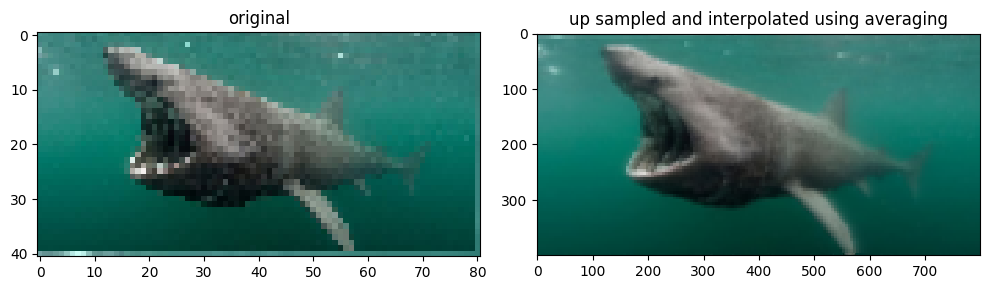

In [98]:
us = 5

image_up = image.copy()

# insert zeros in down sampled image
sh = image_down.shape
rw = 0
cl = 0

for row in (0, sh[0]-1):
  cl = 0
  for col in range(0, sh[1]-1):
    image_up[rw][cl] = image_down[row][col]
    image_up[rw, cl+1:cl+us] = 0
    cl = cl + us

  image_up[rw+1:rw+us, :] = 0
  rw = rw + us

shu = image_up.shape

# using average for interpolation
for row in range(0, shu[0], us):
  for col in range(0, shu[1]-us, us):
    temp1 = (image_up[row, col])/2
    temp2 = (image_up[row, col+us])/2
    temp = temp1 + temp2
    image_up[row, col+1:col+ds] = [int(temp[0]), int(temp[1]), int(temp[2])]

for row in range(0, shu[0]-us, us):
  for col in range(0, shu[1]):
    temp1 = (image_up[row, col])/2
    temp2 = (image_up[row+us, col])/2
    temp = temp1 + temp2
    image_up[row:row+us, col] = [int(temp[0]), int(temp[1]), int(temp[2])]

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('original')
io.imshow(image_down)

plt.subplot(1, 2, 2)
plt.title('up sampled and interpolated using averaging')
io.imshow(image_up, cmap = 'gray')

# **Experiment 03 Histogram Equalisation**

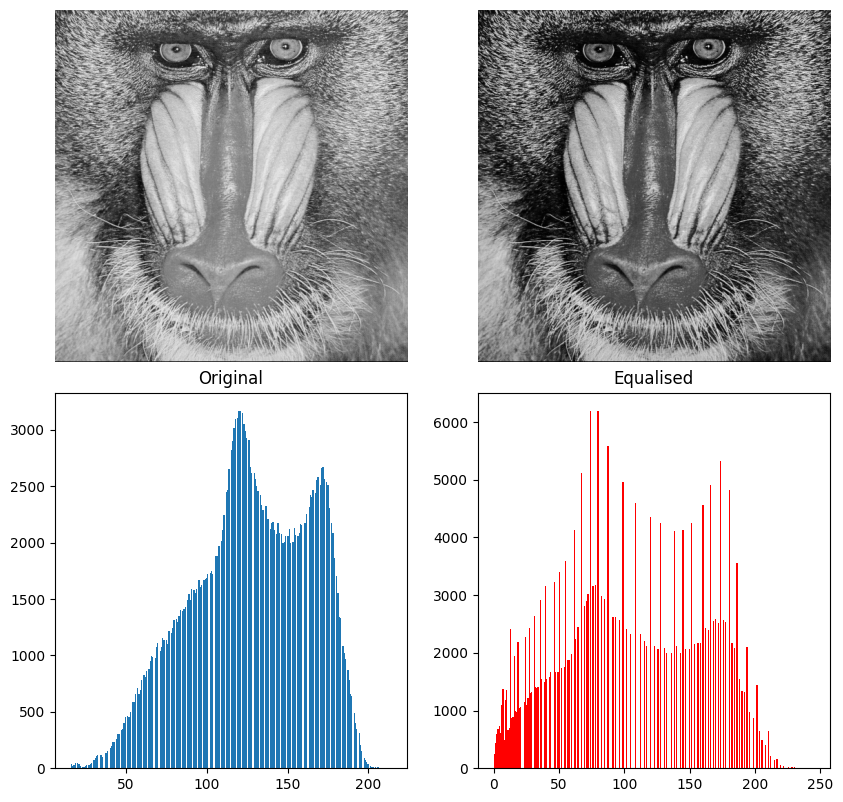

In [99]:
img = mpimg.imread('baboon.tif')
img.dtype, img.shape, type(img)

imgeq = img.copy()

px = img.shape[0]*img.shape[1]
imhist, bins = np.histogram(img.flatten(), 256)
cdf = imhist.cumsum()
newgray = (cdf*255/px).astype(int)

for i in range(img.shape[0]):
  for j in range(img.shape[1]):
    temp = img[i][j]
    imgeq[i][j] = newgray[temp]

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(imgeq, cmap = 'gray')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Original')
ax = plt.hist(img.ravel(), bins = 256)

plt.subplot(2, 2, 4)
plt.title('Equalised')
ax = plt.hist(imgeq.ravel(), bins = 256, color = 'red')

plt.subplots_adjust(hspace = 0.05)
plt.show()

**# New Section**

# **Experiment 04 Spatial Filtering**

## **(a) Gaussian Noise Removal Using Averaging Filter**

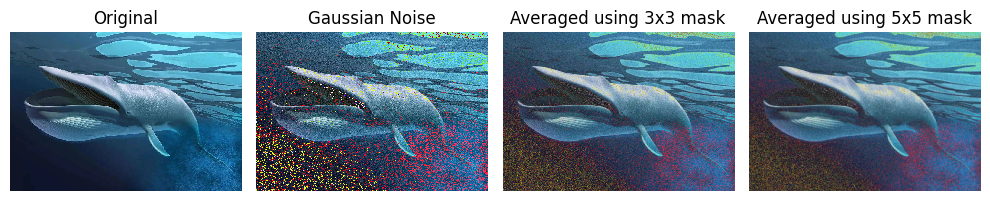

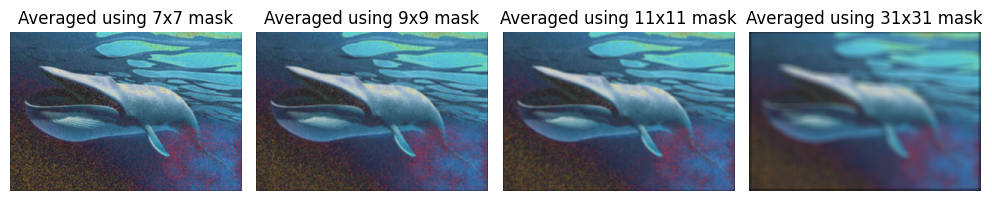

In [100]:
image_og = io.imread('whale.jpg')
image = image_og
sh = image.shape

#add gaussian noise to image
#sigma 5, 10, 20

mu, sigma = 0, 20
gn = np.random.normal(mu, sigma, (sh[0], sh[1]))
gn.shape

image_gn = image.copy()

#adding noise to all frame (r, g, b) of the colour image
#[:, :, x] denotes all rows, all column, frame
image_gn[:, :, 0] = image[:, :, 0] + gn
image_gn[:, :, 1] = image[:, :, 1] + gn
image_gn[:, :, 2] = image[:, :, 2] + gn

sz = 3  #size of mask
avg_mask = np.ones((sz, sz))/(sz*sz)

image_avg_3 = image_gn.copy()
image_avg_3[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], avg_mask, mode='same')  #make average image for the red frame by 2d convolution on image_gn red frame using avg_mask
image_avg_3[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], avg_mask, mode='same')  #mode='same' does zero padding, 'valid' does truncation
image_avg_3[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], avg_mask, mode='same')

sz = 5  #size of mask
avg_mask = np.ones((sz, sz))/(sz*sz)

image_avg_5 = image_gn.copy()
image_avg_5[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], avg_mask, mode='same')  #make average image for the red frame by 2d convolution on image_gn red frame using avg_mask
image_avg_5[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], avg_mask, mode='same')  #mode='same' does zero padding, 'valid' does truncation
image_avg_5[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], avg_mask, mode='same')

sz = 7  #size of mask
avg_mask = np.ones((sz, sz))/(sz*sz)

image_avg_7 = image_gn.copy()
image_avg_7[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], avg_mask, mode='same')  #make average image for the red frame by 2d convolution on image_gn red frame using avg_mask
image_avg_7[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], avg_mask, mode='same')  #mode='same' does zero padding, 'valid' does truncation
image_avg_7[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], avg_mask, mode='same')

sz = 9  #size of mask
avg_mask = np.ones((sz, sz))/(sz*sz)

image_avg_9 = image_gn.copy()
image_avg_9[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], avg_mask, mode='same')  #make average image for the red frame by 2d convolution on image_gn red frame using avg_mask
image_avg_9[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], avg_mask, mode='same')  #mode='same' does zero padding, 'valid' does truncation
image_avg_9[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], avg_mask, mode='same')

sz = 11  #size of mask
avg_mask = np.ones((sz, sz))/(sz*sz)

image_avg_11 = image_gn.copy()
image_avg_11[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], avg_mask, mode='same')  #make average image for the red frame by 2d convolution on image_gn red frame using avg_mask
image_avg_11[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], avg_mask, mode='same')  #mode='same' does zero padding, 'valid' does truncation
image_avg_11[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], avg_mask, mode='same')

sz = 31  #size of mask
avg_mask = np.ones((sz, sz))/(sz*sz)

image_avg_31 = image_gn.copy()
image_avg_31[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], avg_mask, mode='same')  #make average image for the red frame by 2d convolution on image_gn red frame using avg_mask
image_avg_31[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], avg_mask, mode='same')  #mode='same' does zero padding, 'valid' does truncation
image_avg_31[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], avg_mask, mode='same')

plt.figure(figsize=(10, 10))

plt.subplot(1, 4, 1)
io.imshow(image_og)
plt.axis('off')
plt.title('Original')

plt.subplot(1, 4, 2)
plt.title('Gaussian Noise')
plt.axis('off')
io.imshow(image_gn)

plt.subplot(1, 4, 3)
plt.title('Averaged using 3x3 mask')
plt.axis('off')
io.imshow(image_avg_3)

plt.subplot(1, 4, 4)
plt.title('Averaged using 5x5 mask')
plt.axis('off')
io.imshow(image_avg_5)

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(1, 4, 1)
plt.title('Averaged using 7x7 mask')
plt.axis('off')
io.imshow(image_avg_7)

plt.subplot(1, 4, 2)
plt.title('Averaged using 9x9 mask')
plt.axis('off')
io.imshow(image_avg_9)

plt.subplot(1, 4, 3)
plt.title('Averaged using 11x11 mask')
plt.axis('off')
io.imshow(image_avg_11)

plt.subplot(1, 4, 4)
plt.title('Averaged using 31x31 mask')
plt.axis('off')
io.imshow(image_avg_31)

plt.show()

## **(b) Gaussian Noise Removal Using Weighted Averaging Filter**

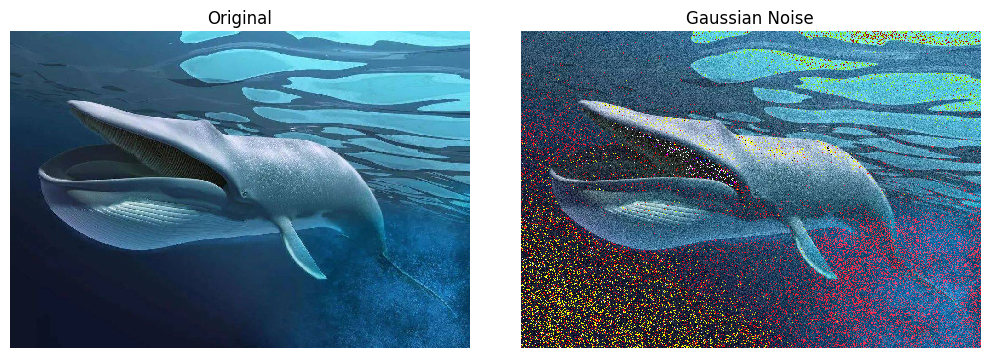

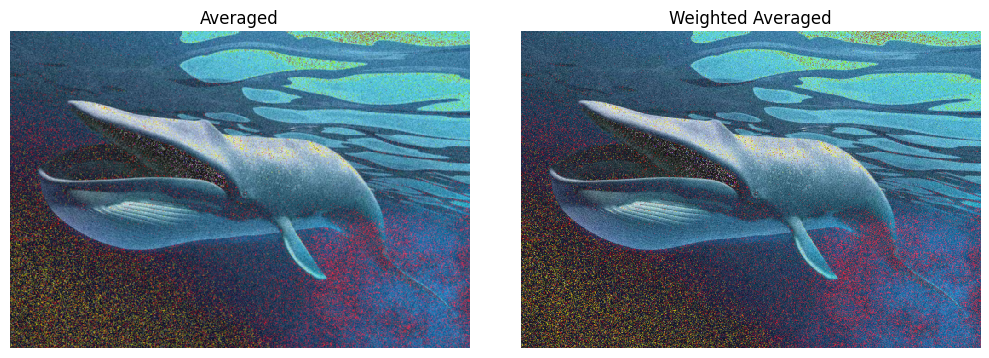

In [101]:
weight_avg_mask = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])/16

image_weighted_avg = image_gn.copy()
image_weighted_avg[:, :, 0] = signal.convolve2d(image_gn[:, :, 0], weight_avg_mask, mode='same')
image_weighted_avg[:, :, 1] = signal.convolve2d(image_gn[:, :, 1], weight_avg_mask, mode='same')
image_weighted_avg[:, :, 2] = signal.convolve2d(image_gn[:, :, 2], weight_avg_mask, mode='same')

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
io.imshow(image_og)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Gaussian Noise')
io.imshow(image_gn)
plt.axis('off')

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Averaged')
io.imshow(image_avg_3)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Weighted Averaged')
io.imshow(image_weighted_avg)
plt.axis('off')

plt.show()

## **(c) Salt and Pepper Noise Removal Using Median Filter**

(-0.5, 383.5, 255.5, -0.5)

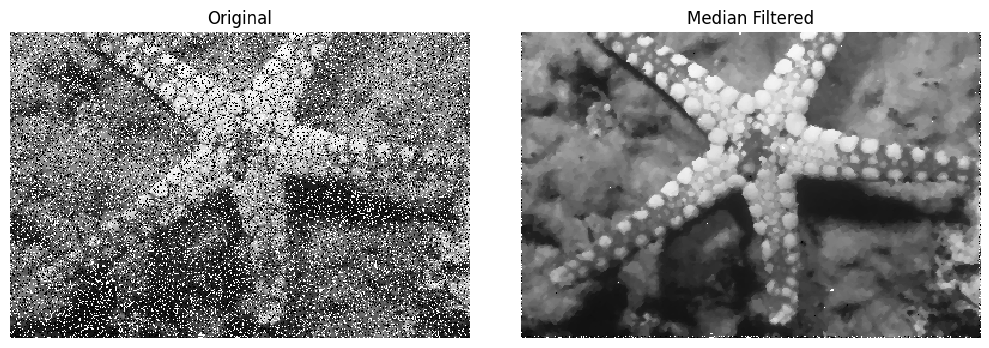

In [102]:
image = io.imread('salt-pepper.png')
image_spnoise = image
sh = image_spnoise.shape

image_spfilter = image_spnoise.copy()

sz = 3
cent = int((sz-1)/2)
med = int(((sz*sz)-1)/2)

for row in range(0, sh[0]-sz):
  for col in range(0, sh[1]-sz):
    temp = image_spfilter[row:row+sz, col:col+sz]
    temp = np.reshape(temp, (1, sz*sz))
    temp = np.sort(temp)
    image_spfilter[row+cent, col+cent] = temp[0][med]

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
io.imshow(image_spnoise)
plt.title('Original')
plt.axis('off')

plt.subplot(1, 2, 2)
io.imshow(image_spfilter)
plt.title('Median Filtered')
plt.axis('off')

## **(d) Image Sharpening Using Laplacian Filter**

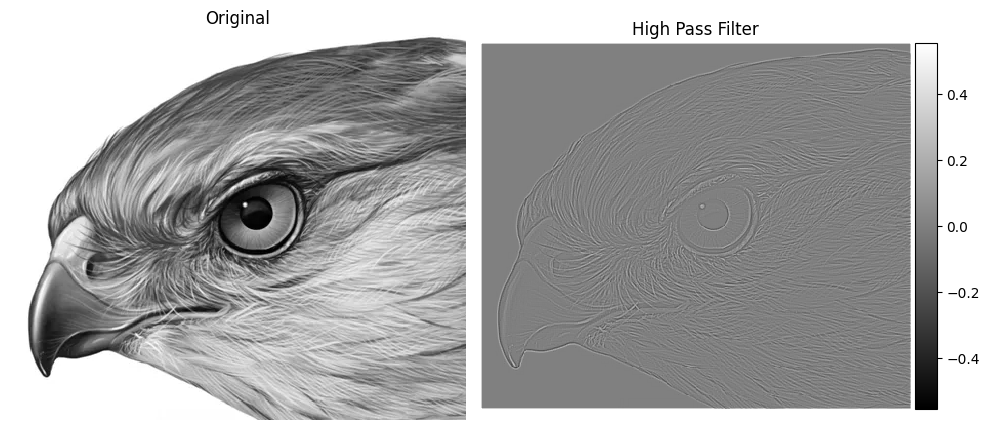

In [103]:
image_og = io.imread('hawk.png')
image = rgb2gray(image_og)
sh = image.shape

hpf = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])/9

image_high = image.copy()
image_high[:, :] = signal.convolve2d(image[:, :], hpf, mode='same')

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.axis('off')
io.imshow(image)

plt.subplot(1, 2, 2)
plt.title('High Pass Filter')
plt.axis('off')
io.imshow(image_high, cmap = 'gray')

plt.show()

## **(e) Image Sharpening Using High Boost Filter**

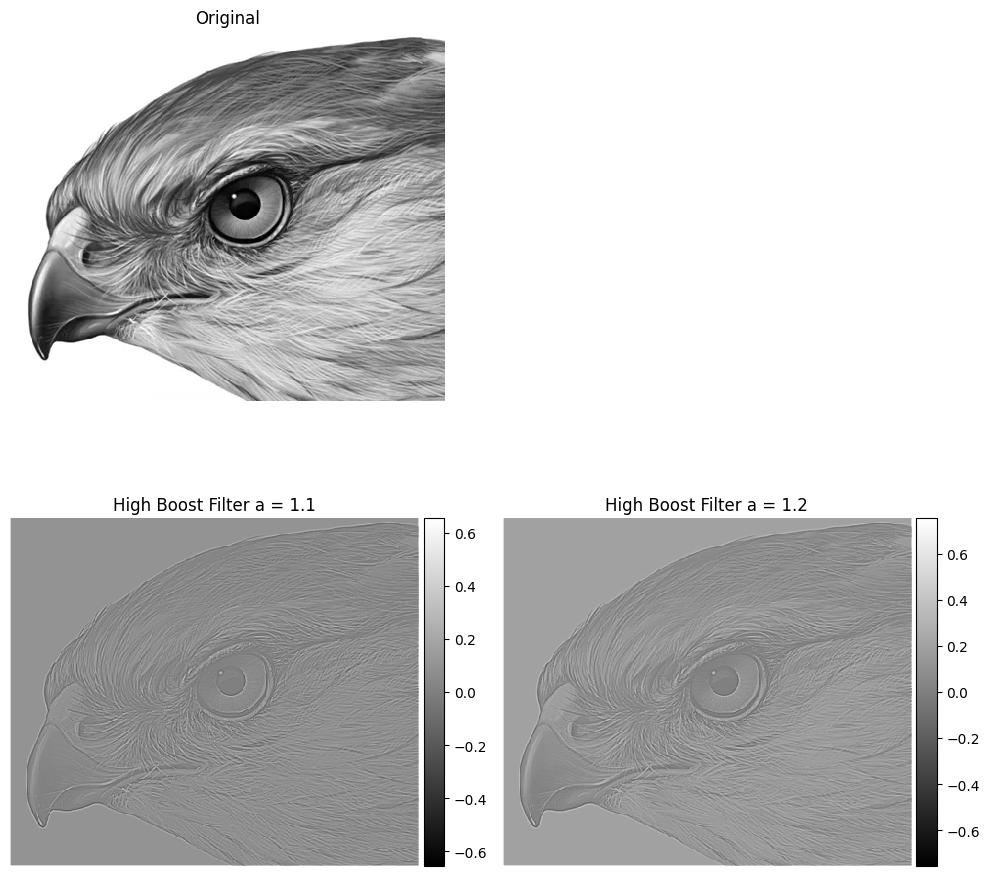

In [104]:
a = 1.1
image_high_boost_1 = (a-1)*image + image_high

a = 1.2
image_high_boost_2 = (a-1)*image + image_high

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.title('Original')
plt.axis('off')
io.imshow(image)

plt.subplot(2, 2, 3)
plt.title('High Boost Filter a = 1.1')
plt.axis('off')
io.imshow(image_high_boost_1, cmap = 'gray')

plt.subplot(2, 2, 4)
plt.title('High Boost Filter a = 1.2')
plt.axis('off')
io.imshow(image_high_boost_2, cmap = 'gray')

plt.show()

## **(f) Image Sharpening Using Unsharp Masking**

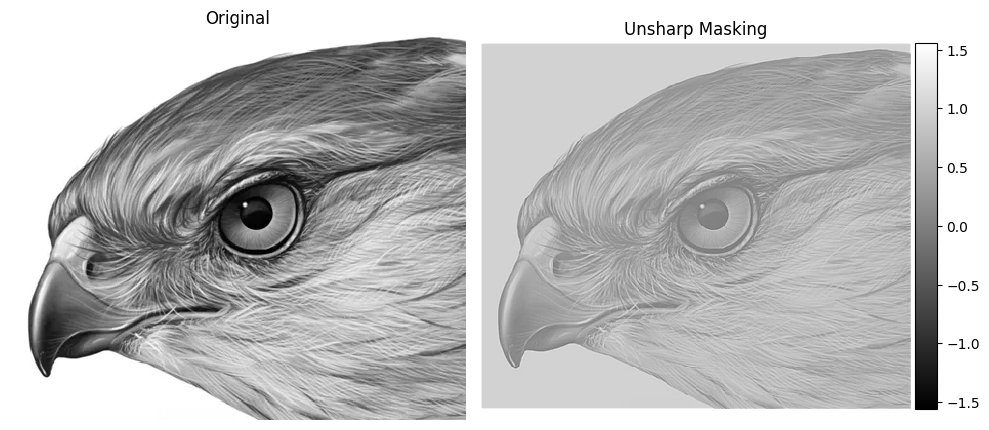

In [105]:
image_unsharp = image + image_high

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.axis('off')
io.imshow(image)

plt.subplot(1, 2, 2)
plt.title('Unsharp Masking')
plt.axis('off')
io.imshow(image_unsharp, cmap = 'gray')

plt.show()

# **Experiment 05 Image Transforms**

## **(a) Hadamard Transform**

In [106]:
N = 4

#Implementing 2D Hadamard on a given NxN matrix
# generate integer numbers between 0 and 19
mat = np.random.randint(20, size= (N, N))
print(mat)

# Hadamard matrix of order N
H = hadamard(N)
print("\n", H)

mat_had= np.dot(H, mat)  #using np.dot function for matrix multiplication
mat_had= np.dot(mat_had, np.transpose(H))
print("\n", mat_had)

# Inverse Hadamard transform
mat_new = np.dot(np.transpose(H), mat_had)
mat_new = np.dot(mat_new, H)
mat_new = mat_new//(N*N)
print("\n", mat_new)

[[10 14 17  8]
 [10 18 19 19]
 [ 6  0 11 13]
 [16 11  1 11]]

 [[ 1  1  1  1]
 [ 1 -1  1 -1]
 [ 1  1 -1 -1]
 [ 1 -1 -1  1]]

 [[184  -4 -14   2]
 [-26  22 -24 -12]
 [ 46  -2  -8 -44]
 [ -8   4  42   2]]

 [[10 14 17  8]
 [10 18 19 19]
 [ 6  0 11 13]
 [16 11  1 11]]


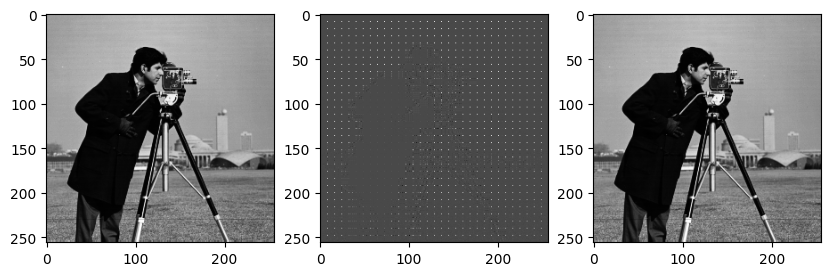

In [107]:
#hadamard transform function
def had(f, N):
  H = hadamard(N)
  F = np.dot(np.dot(H, f),H)
  return(F)

#Inverse Hadamard
def had2inv(F, N):
  H = hadamard(N)
  f = np.dot(np.dot(H,F), H)
  f = f//(N*N)

  return(f)


img = mpimg.imread('camera.tif')
r, c = img.shape #Find and store size of image in m,n

N = 8
# Hadamard Transform
imghad = np.zeros((r,c), dtype=int)

for row in range(r//N):
  for col in range(c//N):
    imghad[row*N:(row+1)*N,col*N:(col+1)*N] = had(img[row*N:(row+1)*N,col*N:(col+1)*N], N)

#Inverse Hadamard transform
imgnew = np.zeros((r,c), dtype=int)
for row in range(r//N):
  for col in range(c//N):
    imgnew[row*N:(row+1)*N,col*N:(col+1)*N] = had2inv(imghad[row*N:(row+1)*N,col*N:(col+1)*N], N)

plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.imshow(img, cmap="gray")
plt.subplot(1,3,2)
plt.imshow(imghad, cmap="gray")
plt.subplot(1,3,3)
plt.imshow(imgnew, cmap="gray")

## **(b) Walsh Transform**

In [108]:
N=4

# walsh transform
W = hadamard(N)/4
print(W)

mat = np.random.randint(20, size= (N,N))
print("\n", mat)

# Walsh tranform of image
mat_walsh = np.dot(W, mat) #using np.dot function for matrix multiplication
mat_walsh = np.dot(mat_walsh, np.transpose(W))
print("\n", mat_walsh)

# Inverse Walsh transform
mat_new = np.dot(np.transpose(W), mat_walsh)
mat_new = np.dot(mat_new, W)
mat_new = mat_new*(N*N)
print("\n", mat_new)

[[ 0.25  0.25  0.25  0.25]
 [ 0.25 -0.25  0.25 -0.25]
 [ 0.25  0.25 -0.25 -0.25]
 [ 0.25 -0.25 -0.25  0.25]]

 [[ 7 18 14 17]
 [12 17 16  8]
 [ 7 10 10  5]
 [18  8  0 15]]

 [[11.375 -0.875  0.75  -0.25 ]
 [-0.375 -0.625 -1.25  -1.75 ]
 [ 2.25  -0.5   -0.875 -2.375]
 [ 0.75  -1.5   -0.125  2.375]]

 [[ 7. 18. 14. 17.]
 [12. 17. 16.  8.]
 [ 7. 10. 10.  5.]
 [18.  8.  0. 15.]]


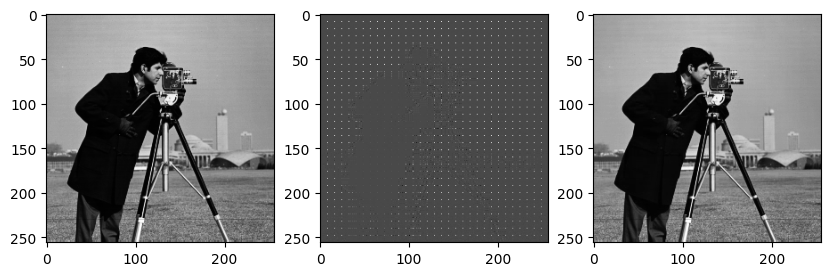

In [109]:
def walsh(f, N):
  W = hadamard(N)/4
  F = np.dot(np.dot(W, f), np.transpose(W))
  return(F)

def iwalsh(F, N):
  W = hadamard(N)/4
  f = np.dot(np.dot(np.transpose(W),F), W)
  f = f*(N*N)

  return(f)


img = mpimg.imread('camera.tif')
r, c = img.shape #Find and store size of image in m,n

N = 8

imgwalsh = np.zeros((r,c), dtype=int)
for row in range(r//N):
  for col in range(c//N):
    imgwalsh[row*N:(row+1)*N,col*N:(col+1)*N] = walsh(img[row*N:(row+1)*N,col*N:(col+1)*N], N)

imgnew = np.zeros((r,c), dtype=int)
for row in range(r//N):
  for col in range(c//N):
    imgnew[row*N:(row+1)*N,col*N:(col+1)*N] = iwalsh(imgwalsh[row*N:(row+1)*N,col*N:(col+1)*N], N)

plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.imshow(img, cmap="gray")
plt.subplot(1,3,2)
plt.imshow(imgwalsh, cmap="gray")
plt.subplot(1,3,3)
plt.imshow(imgnew, cmap="gray")

## **(c) DCT**

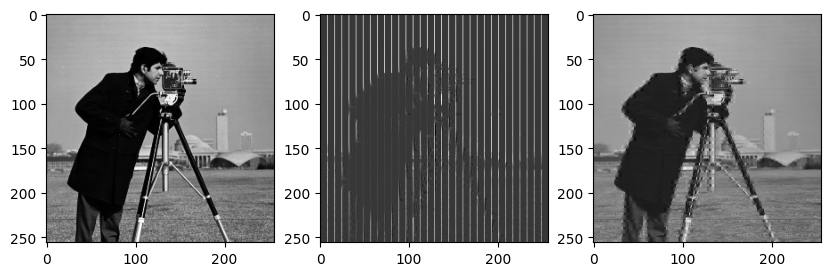

In [110]:
img = mpimg.imread('camera.tif')
m, n = img.shape

N=8

imgdct = np.zeros((m, n),dtype=int)

for r in range(m//N):
  for c in range(n//N):
    temp = dct(img[r*N:(r+1)*N,c*N:(c+1)*N])
    temp[2:7,2:7]=0
    imgdct[r*N:(r+1)*N,c*N:(c+1)*N]=temp

imgidct=np.zeros((m,n),dtype=int)

for r in range(m//N):
  for c in range(n//N):
    imgidct[r*N:(r+1)*N,c*N:(c+1)*N] = idct(imgdct[r*N:(r+1)*N,c*N:(c+1)*N])

plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.imshow(img, cmap="gray")
plt.subplot(1,3,2)
plt.imshow(imgdct, cmap="gray")
plt.subplot(1,3,3)
plt.imshow(imgidct, cmap="gray")

# **Experiment 06 Image Morphology**

## **(a) Erosion**

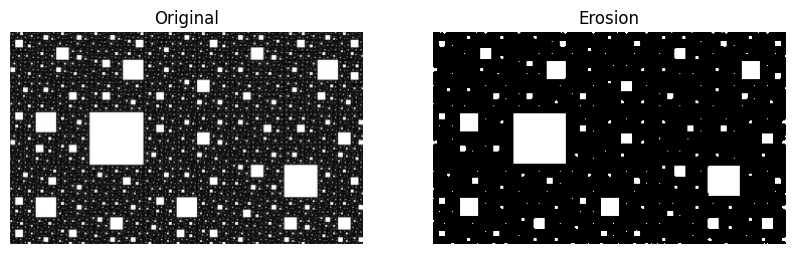

In [111]:
img = mpimg.imread('squares.jpg')

imgt = img.copy()
for i in range(img.shape[0]):
  for j in range(img.shape[1]):
    if imgt[i, j] > 100:
      imgt[i, j] = 255
    else:
      imgt[i, j] = 0

# making structuring element
sz = 3
se = np.ones((sz, sz))*255

mid = int((sz-1)/2)

img_eroded = imgt.copy()
she = img_eroded.shape

for row in range(mid, she[0]-mid):
  for col in range(mid, she[1]-mid):
    temp = imgt[row-mid:row+mid+1, col-mid:col+mid+1]
    if np.array_equal(temp, se):
      img_eroded[row, col] = 255
    else:
      img_eroded[row, col] = 0

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Erosion')
plt.imshow(img_eroded, cmap = 'gray')
plt.axis('off')

plt.show()

## **(b) Dilation**

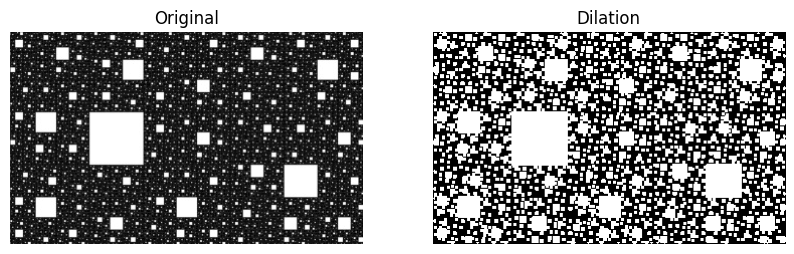

In [112]:
img_dilated = imgt.copy()
shd = img_dilated.shape

for row in range(mid, shd[0]-mid):
  for col in range(mid, shd[1]-mid):
    temp = imgt[row-mid:row+mid+1, col-mid:col+mid+1]
    if np.isin(255, temp):
      img_dilated[row, col] = 255
    else:
      img_dilated[row, col] = 0

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Dilation')
plt.imshow(img_dilated, cmap = 'gray')
plt.axis('off')

plt.show()

## **(b) Opening**

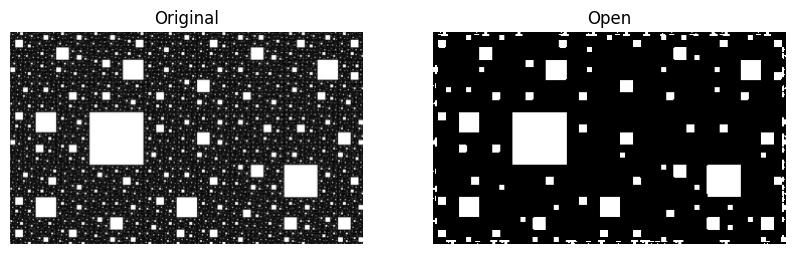

In [113]:
img = mpimg.imread('squares.jpg')

imgt = img.copy()
for i in range(img.shape[0]):
  for j in range(img.shape[1]):
    if imgt[i, j] > 100:
      imgt[i, j] = 255
    else:
      imgt[i, j] = 0

# making structuring element
sz = 5
se = np.ones((sz, sz))*255
mid = int((sz-1)/2)

imge = imgt.copy()
she = imge.shape
for row in range(mid, she[0]-mid):
  for col in range(mid, she[1]-mid):
    temp = imgt[row-mid:row+mid+1, col-mid:col+mid+1]
    if np.array_equal(temp, se):
      imge[row, col] = 255
    else:
      imge[row, col] = 0

img_open = imge.copy()
sho = img_open.shape
for row in range(mid, shd[0]-mid):
  for col in range(mid, shd[1]-mid):
    temp = imge[row-mid:row+mid+1, col-mid:col+mid+1]
    if np.isin(255, temp):
      img_open[row, col] = 255
    else:
      img_open[row, col] = 0

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Open')
plt.imshow(img_open, cmap = 'gray')
plt.axis('off')

plt.show()

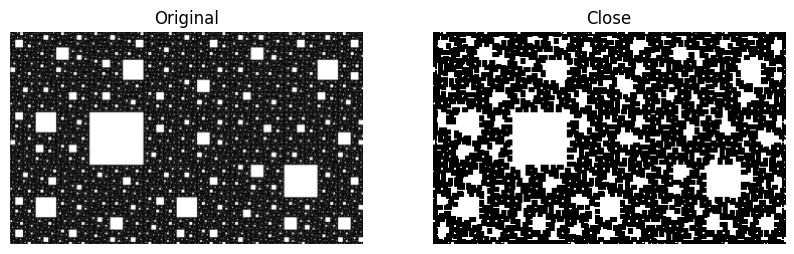

In [114]:
img = mpimg.imread('squares.jpg')

imgt = img.copy()
for i in range(img.shape[0]):
  for j in range(img.shape[1]):
    if imgt[i, j] > 100:
      imgt[i, j] = 255
    else:
      imgt[i, j] = 0

# making structuring element
sz = 5
se = np.ones((sz, sz))*255
mid = int((sz-1)/2)

imgd = imgt.copy()
she = imgd.shape
for row in range(mid, she[0]-mid):
  for col in range(mid, she[1]-mid):
    temp = imgt[row-mid:row+mid+1, col-mid:col+mid+1]
    if np.isin(255, temp):
      imgd[row, col] = 255
    else:
      imgd[row, col] = 0

img_close = imge.copy()
sho = img_close.shape
for row in range(mid, shd[0]-mid):
  for col in range(mid, shd[1]-mid):
    temp = imgd[row-mid:row+mid+1, col-mid:col+mid+1]
    if np.array_equal(temp, se):
      img_close[row, col] = 255
    else:
      img_close[row, col] = 0

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(img, cmap = 'gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Close')
plt.imshow(img_close, cmap = 'gray')
plt.axis('off')

plt.show()

# **Experiment 07 Image Segmentation**

## **(a) Edge Detection Using Sobel Operator**

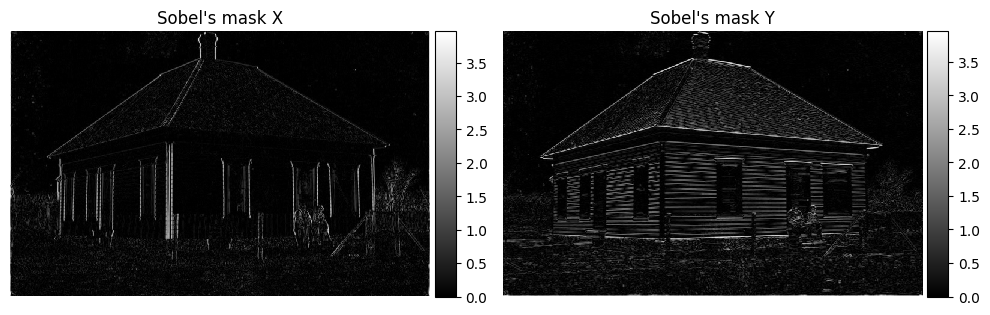

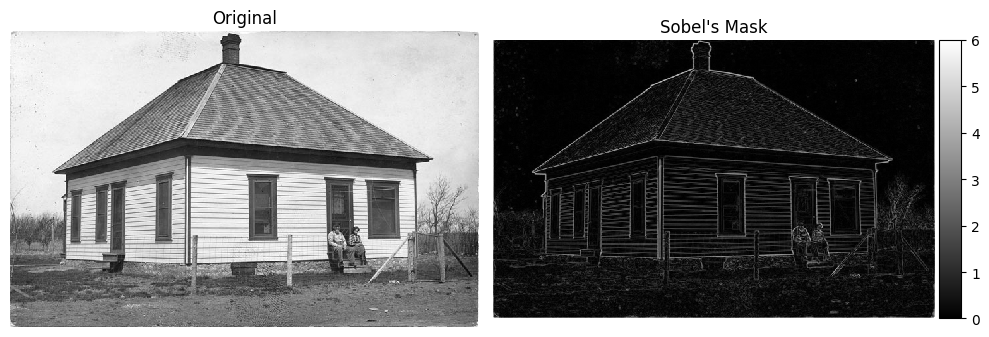

In [115]:
image_og = io.imread('house.jpg')
image = rgb2gray(image_og)
sh = image.shape

sobel_x_mask = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

image_sobel_x = image.copy()
image_sobel_x[:, :] = abs(signal.convolve2d(image[:, :], sobel_x_mask, mode='same'))

sobel_y_mask = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

image_sobel_y = image.copy()
image_sobel_y[:, :] = abs(signal.convolve2d(image[:, :], sobel_y_mask, mode='same'))

image_sobel = abs(image_sobel_x) + abs(image_sobel_y)

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title("Sobel's mask X")
plt.axis('off')
io.imshow(image_sobel_x, cmap = 'gray')

plt.subplot(1, 2, 2)
plt.title("Sobel's mask Y")
plt.axis('off')
io.imshow(image_sobel_y, cmap = 'gray')

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.axis('off')
io.imshow(image_og)

plt.subplot(1, 2, 2)
plt.title("Sobel's Mask")
plt.axis('off')
io.imshow(image_sobel, cmap = 'gray')

plt.show()

## **(b) Edge Detection Using Prewitt Operator**

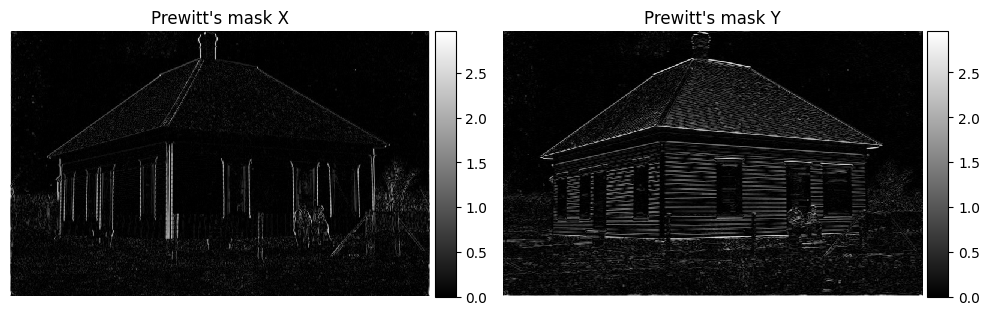

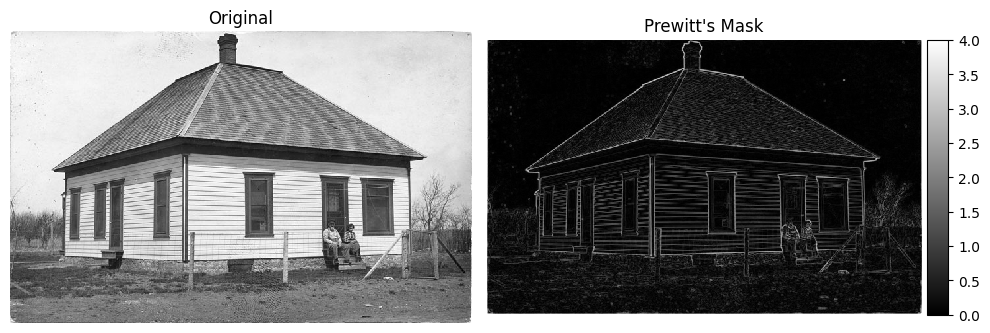

In [116]:
image_og = io.imread('house.jpg')
image = rgb2gray(image_og)
sh = image.shape

prewitt_x_mask = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])

image_prewitt_x = image.copy()
image_prewitt_x[:, :] = abs(signal.convolve2d(image[:, :], prewitt_x_mask, mode='same'))

prewitt_y_mask = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

image_prewitt_y = image.copy()
image_prewitt_y[:, :] = abs(signal.convolve2d(image[:, :], prewitt_y_mask, mode='same'))

image_prewitt = abs(image_prewitt_x) + abs(image_prewitt_y)

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title("Prewitt's mask X")
plt.axis('off')
io.imshow(image_prewitt_x, cmap = 'gray')

plt.subplot(1, 2, 2)
plt.title("Prewitt's mask Y")
plt.axis('off')
io.imshow(image_prewitt_y, cmap = 'gray')

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.axis('off')
io.imshow(image_og)

plt.subplot(1, 2, 2)
plt.title("Prewitt's Mask")
plt.axis('off')
io.imshow(image_prewitt, cmap = 'gray')

plt.show()

## **(c) Edge Detection Using Laplacian Operator**

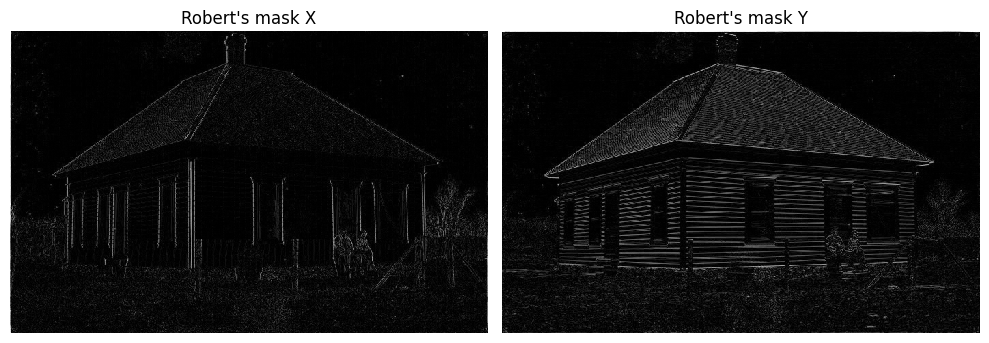

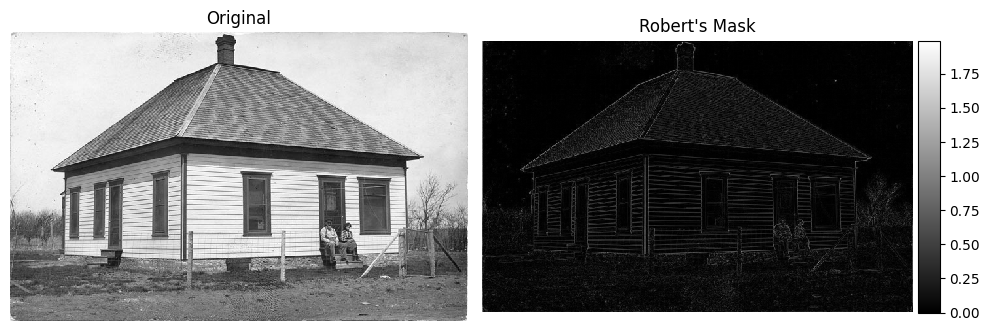

In [117]:
image_og = io.imread('house.jpg')
image = rgb2gray(image_og)
sh = image.shape

robert_x_mask = np.array([[0, 0, 0], [0, 1, -1], [0, 0, 0]])

image_robert_x = image.copy()
image_robert_x[:, :] = abs(signal.convolve2d(image[:, :], robert_x_mask, mode='same'))

robert_y_mask = np.array([[0, 0, 0], [0, 1, 0], [0, -1, 0]])

image_robert_y = image.copy()
image_robert_y[:, :] = abs(signal.convolve2d(image[:, :], robert_y_mask, mode='same'))

image_robert = abs(image_robert_x) + abs(image_robert_y)

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title("Robert's mask X")
plt.axis('off')
io.imshow(image_robert_x, cmap = 'gray')

plt.subplot(1, 2, 2)
plt.title("Robert's mask Y")
plt.axis('off')
io.imshow(image_robert_y, cmap = 'gray')

plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.axis('off')
io.imshow(image_og)

plt.subplot(1, 2, 2)
plt.title("Robert's Mask")
plt.axis('off')
io.imshow(image_robert, cmap = 'gray')

plt.show()

# **Experiment 08 Edge Detection Using Canny Edge Detector**

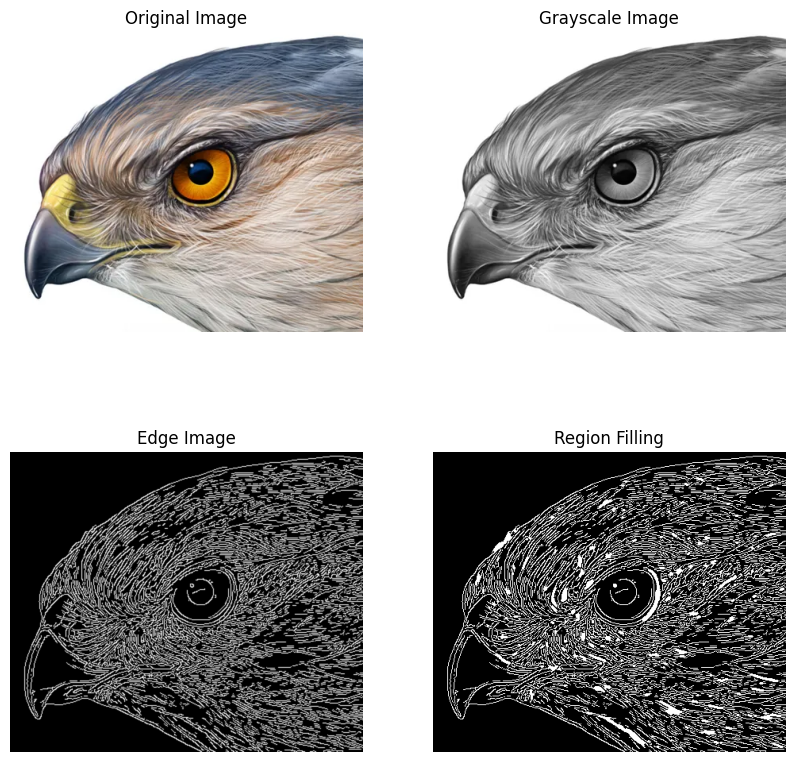

In [118]:
img = cv.imread('hawk.png')

# OpenCV uses BGR as its default colour order for images, matplotlib uses RGB.
# When you display an image loaded with OpenCv in matplotlib the channels will
# be back to front.
# Use the cvtColor() function to RGB the image
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# The rgb2gray function converts RGB images to grayscale
# img_gray = rgb2gray(img_rgb)

# Read in gray scale mode OpenCV
img_gray = cv.imread('hawk.png', 0)

edges = cv.Canny(img_gray, 100, 150)
fill_im = nd.binary_fill_holes(edges)

plt.figure(figsize=(10,10))

plt.subplot(221)
plt.title('Original Image')
plt.axis('off')
plt.imshow(img_rgb)

plt.subplot(222)
plt.title('Grayscale Image')
plt.axis('off')
plt.imshow(img_gray, cmap = 'gray')

plt.subplot(223)
plt.title("Edge Image")
plt.axis('off')
plt.imshow(edges,interpolation='gaussian', cmap='gray')

plt.subplot(224)
plt.title("Region Filling")
plt.axis('off')
plt.imshow(fill_im, cmap='gray')

plt.show()

# **Experiment 09 Image Segmentation Using Region Growing**

In [119]:
def distance(a,b):
  return np.abs(a-b)

def region_growing(img, img_g, thresh, seed):
  x=seed[0]
  y=seed[1]
  img_g[x,y]=1
  [rows,cols]=img.shape

  #calculate the region mean
  px=img[x,y]
  if (y+1<cols and img_g[x,y+1]==0 and distance(px,img[x,y+1]) <=thresh):
    region_growing(img,img_g,thresh,[x,y+1])
  if (y-1>=0 and img_g[x,y-1]==0 and distance(px,img[x,y-1]) <=thresh):
    region_growing(img,img_g,thresh,[x,y-1])
  if (x+1<rows and img_g[x+1,y]==0 and distance(px,img[x+1,y]) <=thresh):
    region_growing(img,img_g,thresh,[x+1,y])
  if (x-1>=0 and img_g[x-1,y]==0 and distance(px,img[x-1,y]) <=thresh):
    region_growing(img,img_g,thresh,[x-1,y])

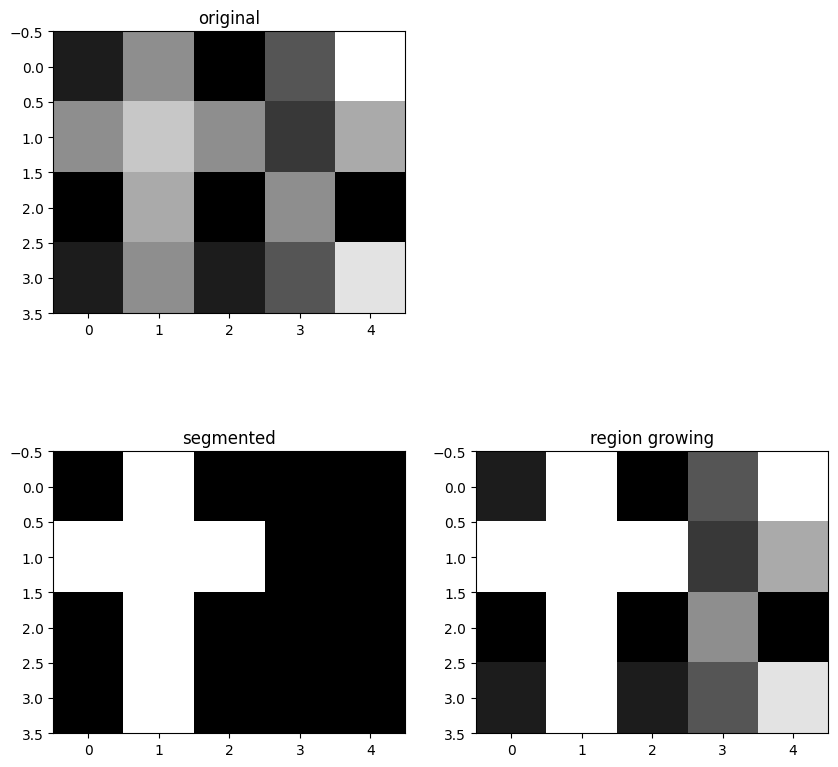

In [120]:
image=np.array([[1,5,0,3,9],[5,7,5,2,6],[0,6,0,5,0],[1,5,1,3,8]],dtype=int)
mx=np.max(np.max(image))

img_seg = np.zeros(image.shape)

region_growing(image,img_seg, 2, [1, 1])

img_modi = image.copy()

for r in range(4):
  for c in range (5):
    if img_seg[r,c] == 1:
      img_modi[r,c] = mx

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.title('original')
plt.imshow(image, cmap = 'gray')

plt.subplot(2, 2, 3)
plt.title('segmented')
plt.imshow(img_seg, cmap = 'gray')

plt.subplot(2, 2, 4)
plt.title('region growing')
plt.imshow(img_modi, cmap = 'gray')

plt.show()

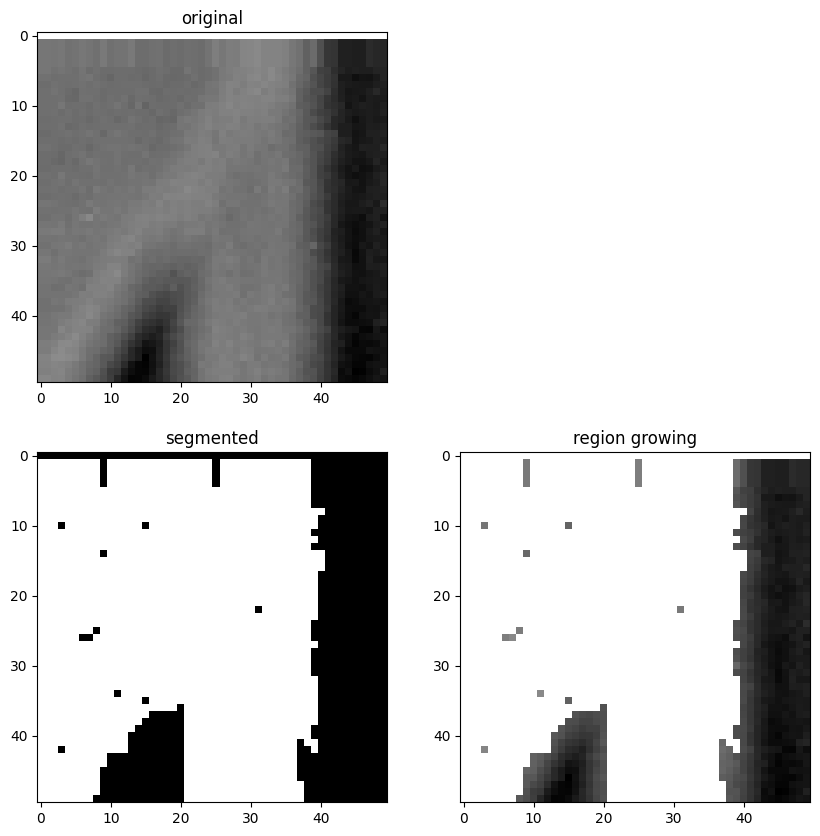

In [121]:
image=io.imread('lena.png')
image=255*rgb2gray(image)
image=image[0:50, 0:50]

mx=int(np.max(np.max(image)))

[rows, cols] = image.shape
img_seg=np.zeros(image.shape)

seed=[5,10]
thresh=5

region_growing(image, img_seg, thresh, seed)
img_seg = img_seg*255

img_modi = image.copy()

for r in range(rows):
  for c in range (cols):
    if img_seg[r,c] == 255:
      img_modi[r,c] = mx

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.title('original')
plt.imshow(image, cmap = 'gray')

plt.subplot(2, 2, 3)
plt.title('segmented')
plt.imshow(img_seg, cmap = 'gray')

plt.subplot(2, 2, 4)
plt.title('region growing')
plt.imshow(img_modi, cmap = 'gray')

plt.show()

# **Experiment 10 Video Processing**

## **(a) Extracting Frames**

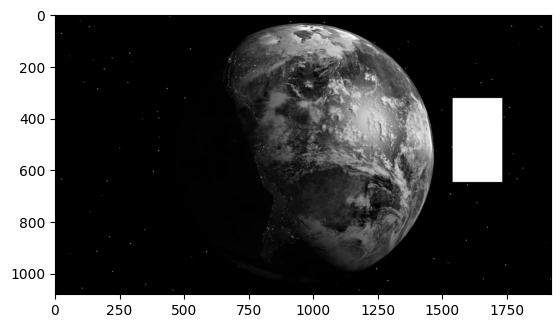

In [122]:
# Opens the Video file
cap= cv.VideoCapture('globe.mp4')

i=0
while(cap.isOpened()):
  ret, frame = cap.read()
  if ret == False:
    break

  # saving each frame as jpg image. Name of the frame starts with 'abc'. Frame number is append
  cv.imwrite('abc'+str(i)+'.jpg', frame)
  i+=1

# At the end of loop, i is 900. therefore number of frames in video is last value of i
numb_frames=i

# modify some frames of video
strt_fr=int(numb_frames/3)
stp_fr=int(numb_frames*2/3)

#add white square in the frames to be modified
# use first frame to get the size of frames
img = cv.imread('abc0.jpg', 0)
sh=img.shape

# start and stop row and col numbers to include white square
strt_rw=int(sh[0]*3/10)
stp_rw=int(sh[0]*6/10)
strt_col=int(sh[1]*8/10)
stp_col=int(sh[1]*9/10)

# add white square to the chosen frames
for j in range(strt_fr,stp_fr):
  img = cv.imread('abc'+str(j)+'.jpg',0)
  img[strt_rw:stp_rw,strt_col:stp_col]=255
  # replace original frame with the modified image/frame
  cv.imwrite('abc'+str(j)+'.jpg',img)

cap.release()
cv.destroyAllWindows()

plt.imshow(img,cmap='gray')

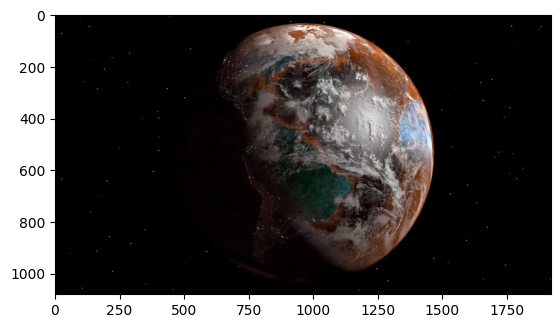

In [123]:
#Create Video from Images
img_array = []
for filename in glob.glob('abc*.jpg'):
  img = cv.imread(filename)
  height, width, layers = img.shape
  size = (width,height)
  img_array.append(img)

out = cv.VideoWriter('out.avi',cv.VideoWriter_fourcc(*'DIVX'), 5, size)

for i in range(len(img_array)):
  out.write(img_array[i])

out.release()

plt.imshow(img_array[i])

## **(b) Motion Vectors**

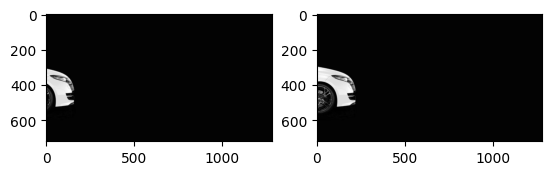

[-100, -120]


In [124]:
# Read the video and save the frames in a list
vid= cv.VideoCapture('car.mp4')

images=[] # Create a list to store all the extracted frames

# Read each frame in the video
while(vid.isOpened()):
  ret, frame = vid.read()
  if ret == False:
    break

  # saving each frame in images list
  images.append(frame)

vid.release()

#Convert the list to numpy array
images=np.array(images)

images=images[:,:,:,0] #Extracting only the zeroth planes of the frames

def min_diff(ref_frame, curr_blk):
  rows,cols= ref_frame.shape #Obtain the number of rows and column in the ref plane
  row_col=[] # array to store upper left corner pixel (row,col) of target block
  mse=[] # array to store difference between each target block and the ref block
  for r in range(0,rows//8):
    for c in range(0,cols//8):
      #select 8x8 subblock of the reference frame
      sub_blk= ref_frame[r*8: (r+1)*8, c*8:(c+1)*8]
      # Find mse between the current block and the subblock in the ref image
      error= np.square(sub_blk-curr_blk).mean(axis=None)
      mse.append(error)
      row_col.append((r*8,c*8))
  mse=np.array(mse)
  row_col= np.array(row_col)
  min_mse=mse.min()
  matched=np.where(mse ==min_mse ) #obtain the index of minimum mse
  return min_mse, row_col[matched]

ref_frame= images[3] #First frame of the video which will be taken as a reference frame
curr_frame= images[4] #Second frame of the video for which motion vector has to be found out w

plt.subplot(1,2,1)
plt.imshow(images[3], cmap="gray")
plt.subplot(1,2,2)
plt.imshow(images[4], cmap="gray")
plt.show()

p = 100
q = 120
#Extract the current block from the current frame for which the motion vector has to be obtain
curr_blk= curr_frame[p: (p+8), q:(q+8)]
mse, coordinates = min_diff(ref_frame, curr_blk)

# top left corner cordinates of matching block with minimum in the reference frame
x=coordinates[0,0] # x coordinate of matching block in the reference plane
y=coordinates[0,1] #y coordinate of matching block in the reference plane

#Obtain motion vector
# reference coordinates - current coordinates
mv = [x-p,y-q]
print(mv)